In [1]:
%matplotlib inline

In [2]:
from astropy.io import fits
import numpy as np

In [3]:
basepath = '/orange/adamginsburg/jwst/brick/'

In [4]:
from astropy.wcs import WCS

In [5]:
ww = WCS(fits.getheader(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb.fits'))
data = np.array(fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb.fits')).copy()

Set OBSGEO-B to   -20.648906 from OBSGEO-[XYZ].
Set OBSGEO-H to 1526264739.299 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


In [6]:
data.shape

(4749, 5945)

In [7]:
import pylab as pl
from astropy.visualization import simple_norm
def imshow_norm(data, ax=None, **kwargs):
    if ax is None:
        ax = pl.gca()
    return ax.imshow(data, norm=simple_norm(data, **kwargs), **kwargs)

In [8]:
pl.rcParams['figure.facecolor'] = 'w'
pl.rcParams['figure.figsize'] = (10,8)
pl.rcParams['figure.dpi'] = 100
pl.rcParams['image.origin'] = 'lower'

In [9]:
import photutils
from photutils.detection import DAOStarFinder, IRAFStarFinder

In [10]:
stars_paa = DAOStarFinder(threshold=30, fwhm=2.06, peakmax=1e4)(data)
len(stars_paa)

26502

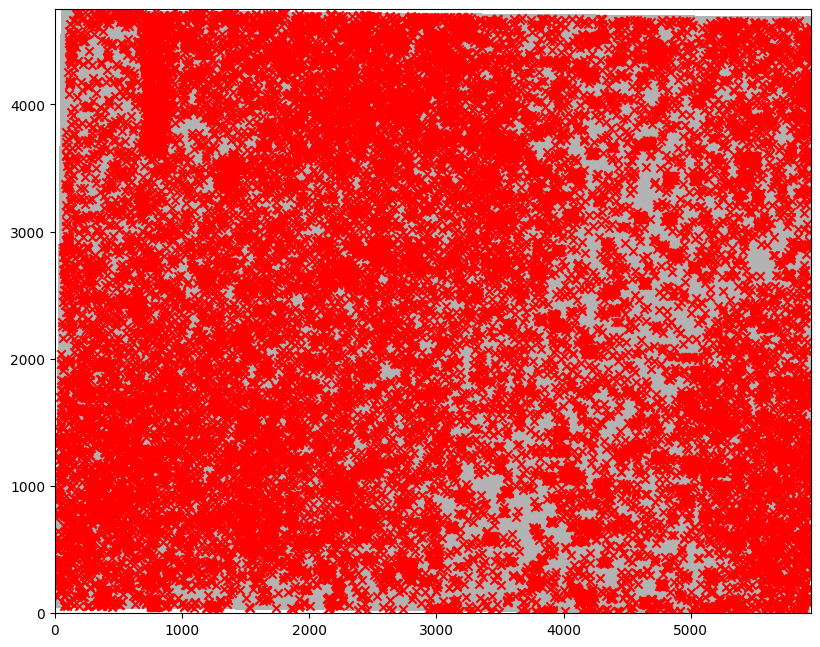

In [11]:
pl.imshow(data, norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r')

In [12]:
import numpy as np
from astropy.convolution import convolve, Gaussian2DKernel

In [13]:
def kill_star(cutout, radius, kernelwidth=1, nanneg=False, zeroneg=True):
    #print(cutout.size)
    cutoutcopy = cutout.copy()
    #print(cutoutcopy.size)
    yy, xx = np.indices(cutout.shape)
    #print("yy")
    rr2 = (xx - cutout.shape[1]/2)**2 + (yy - cutout.shape[0]/2)**2
    #print("rr2")
    msk = rr2 < radius**2
    # ignore negatives
    if nanneg:
        msk[cutoutcopy < 0] = np.nan
    #print('msksum: ',msk.sum())
    cutoutcopy[msk] = np.nan
    sm = convolve(cutoutcopy, Gaussian2DKernel(kernelwidth))
    sm[sm < 0] = 0
    cutoutcopy[msk] = sm[msk]
    return cutoutcopy

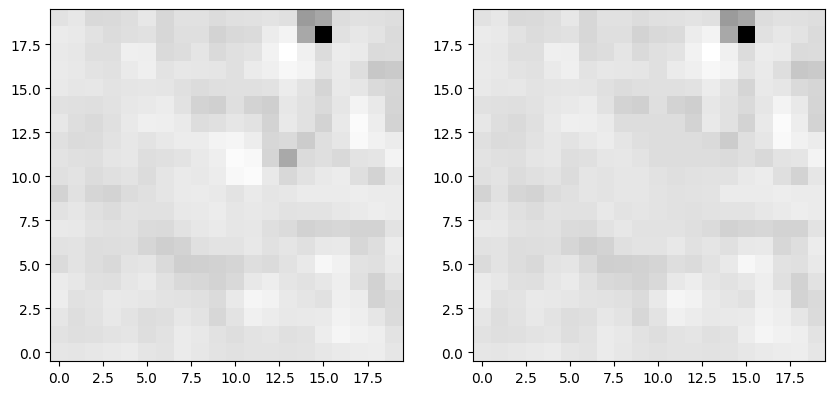

In [14]:
row = stars_paa[350]
sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
co = data[sy-10:sy+10, sx-10:sx+10]
pl.subplot(1,2,1).imshow(co, norm=simple_norm(co, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(kill_star(co, 3.5), norm=simple_norm(co, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')

In [15]:
from tqdm.notebook import tqdm

In [16]:
#datacopy = data.copy()

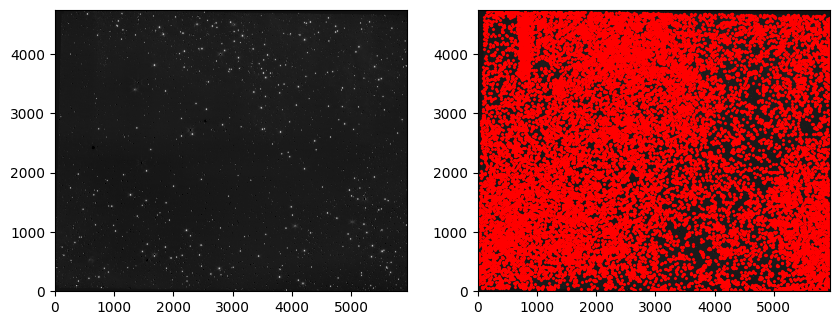

In [17]:
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=1.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=1.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r', s=2)

## Replace NaNs by interpolating

In [18]:
print(np.isnan(data).sum())
for sy, sx in tqdm(zip(*np.where(np.isnan(data)))):
    if sx > 5 and sy > 5 and sy < data.shape[0] - 5 and sx < data.shape[1] - 5:
        co = data[sy-5:sy+5, sx-5:sx+5]
        #print(np.isnan(co)).sum()
        data[sy-5:sy+5, sx-5:sx+5] = kill_star(co, 1)
        #print(np.isnan(data[sy-5:sy+5, sx-5:sx+5]).sum())
print(np.isnan(data).sum())

291526


0it [00:00, ?it/s]

104374


In [19]:
for row in tqdm(stars_paa):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 4.5)

  0%|          | 0/26502 [00:00<?, ?it/s]

In [20]:
np.isnan(data).sum()

104374

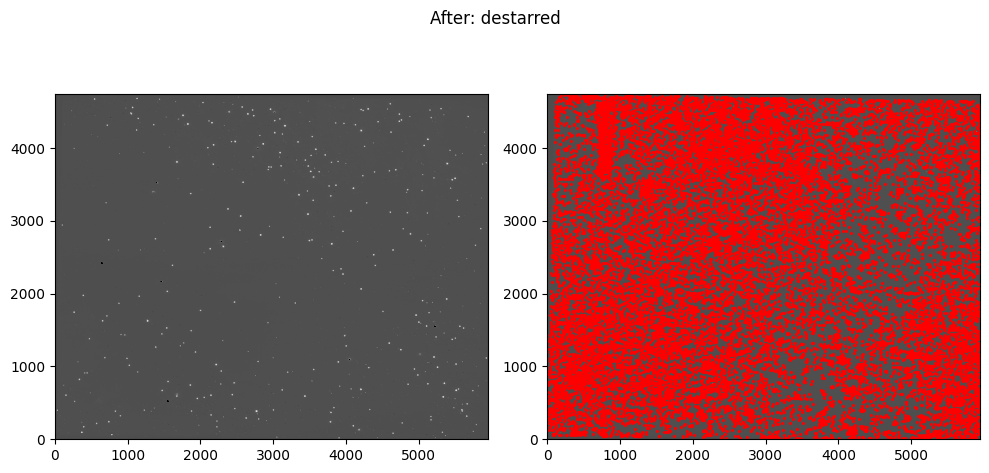

In [21]:
pl.figure(figsize=(10,5))
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r', s=2)
pl.suptitle("After: destarred");
pl.tight_layout();

In [22]:
header = fits.getheader(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb.fits')
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred.fits', overwrite=True)

In [23]:
fh_182 = fits.open(f'{basepath}/F182M/pipeline/jw02221-o001_t001_nircam_clear-f182m-nrcb_i2d.fits')
stars_182 = DAOStarFinder(threshold=150, fwhm=2.06, peakmax=1000)(fh_182['SCI'].data)
len(stars_182)

8277

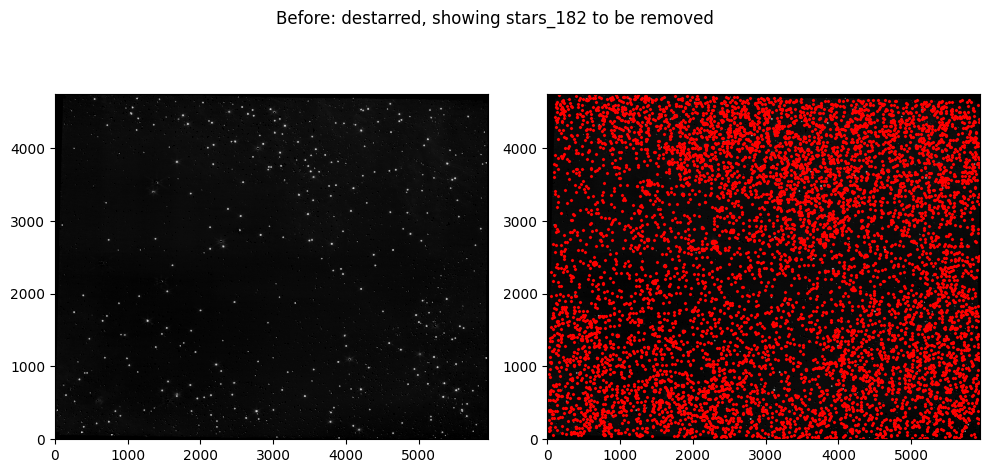

In [24]:
pl.figure(figsize=(10,5))
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.995, stretch='log'), cmap='gray')
pl.scatter(stars_182['xcentroid'], stars_182['ycentroid'], marker='x', color='r', s=2)
pl.suptitle("Before: destarred, showing stars_182 to be removed");
pl.tight_layout()

In [25]:
for row in tqdm(stars_182):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 5.5, 1.5)

  0%|          | 0/8277 [00:00<?, ?it/s]

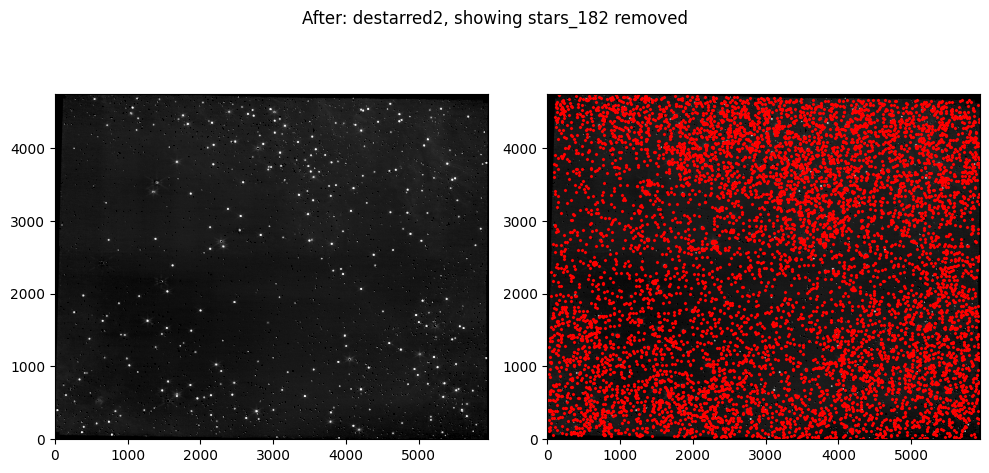

In [26]:
pl.figure(figsize=(10,5))
#pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(stars_182['xcentroid'], stars_182['ycentroid'], marker='x', color='r', s=2)
pl.suptitle("After: destarred2, showing stars_182 removed");
pl.tight_layout();

In [27]:
header = fits.getheader(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb.fits')
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred2.fits', overwrite=True)

In [28]:
fh_187 = fits.open(f'{basepath}/F187N/pipeline/jw02221-o001_t001_nircam_clear-f187n-nrcb_i2d.fits')
stars_paa_br = DAOStarFinder(threshold=1000, fwhm=2.06, peakmax=7e5)(fh_187['SCI'].data)
len(stars_paa_br)

3591

/scratch/local/5800391/ipykernel_19124/3997658170.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')


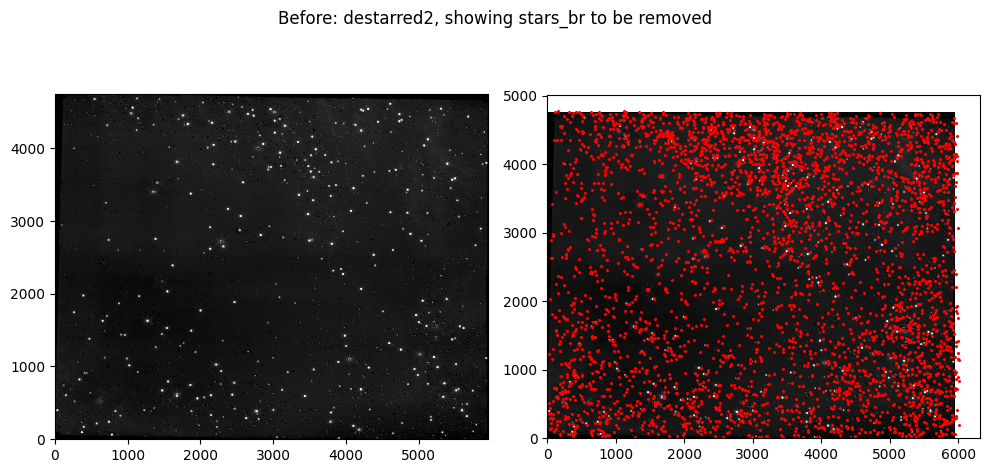

In [29]:
pl.figure(figsize=(10,5))
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(stars_paa_br['xcentroid'], stars_paa_br['ycentroid'], marker='x', color='r', s=2)
pl.suptitle("Before: destarred2, showing stars_br to be removed");
pl.tight_layout();

In [30]:
for row in tqdm(stars_paa_br):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 15 and sy > 15 and sy < data.shape[0] - 15 and sx < data.shape[1] - 15:
        co = data[sy-15:sy+15, sx-15:sx+15]
        data[sy-15:sy+15, sx-15:sx+15] = kill_star(co, 7.5, 2)

  0%|          | 0/3591 [00:00<?, ?it/s]

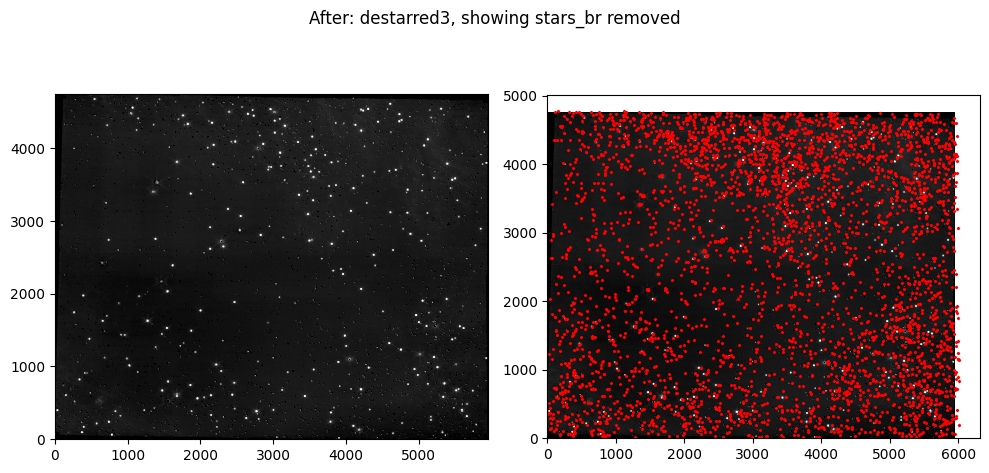

In [31]:
pl.figure(figsize=(10,5))
#pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(stars_paa_br['xcentroid'], stars_paa_br['ycentroid'], marker='x', color='r', s=2)
pl.suptitle("After: destarred3, showing stars_br removed");
pl.tight_layout();

In [32]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred3.fits', overwrite=True)

In [33]:
data = fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred3.fits')

In [34]:
from photutils.segmentation import detect_sources
segment_map = detect_sources(data, 100, npixels=5)

In [35]:
from photutils.segmentation import SourceCatalog
cat = SourceCatalog(data, segment_map)
cattbl = cat.to_table()

In [36]:
cat.area

<Quantity [10.,  6., 31., ..., 13.,  5., 24.] pix2>

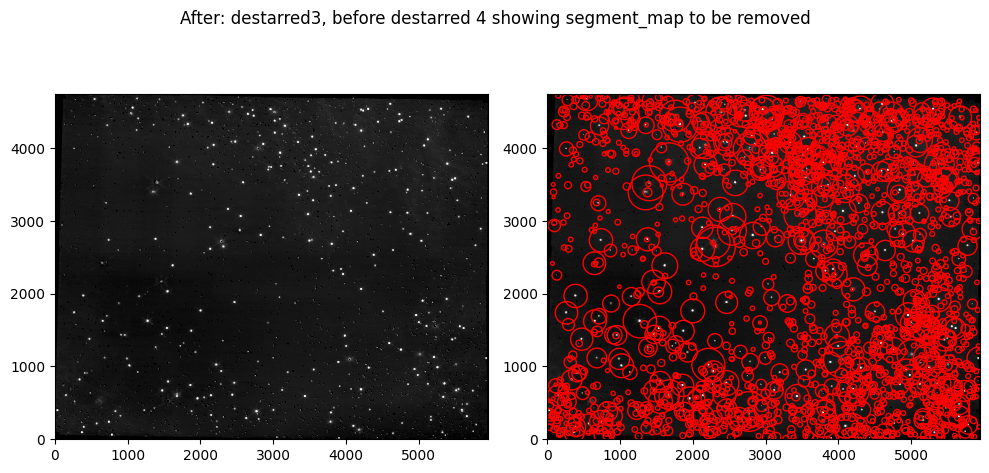

In [37]:
pl.figure(figsize=(10,5))
#pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(cattbl['xcentroid'], cattbl['ycentroid'], marker='o', color='r', facecolor='none', s=cat.area)
pl.suptitle("After: destarred3, before destarred 4 showing segment_map to be removed");
pl.tight_layout();

In [38]:
# this is the extended HII region in nrca xk,yk = 208,782
for row in tqdm(cat):
    
    if row.area.value > 1000: 
        print(f"Skipping {row}, {row.centroid}")
        continue
    if True: #xk < row.bbox.ixmin or xk > row.bbox.ixmax or yk < row.bbox.iymin or yk > row.bbox.ixmax:
        sx,sy = map(int, (row.centroid))
        dx = 30 if row.area.value < 75 else 40
        rad_excise = 15 if row.area.value < 75 else 20
        rad_kernel = 3 if row.area.value < 75 else 5
        if sx > dx and sy > dx and sy < data.shape[0] - dx and sx < data.shape[1] - dx:
            co = data[sy-dx:sy+dx, sx-dx:sx+dx]
            data[sy-dx:sy+dx, sx-dx:sx+dx] = kill_star(co, rad_excise, rad_kernel)
    else:
        print(f"Skipped {row} -> {row.centroid}")

  0%|          | 0/2267 [00:00<?, ?it/s]

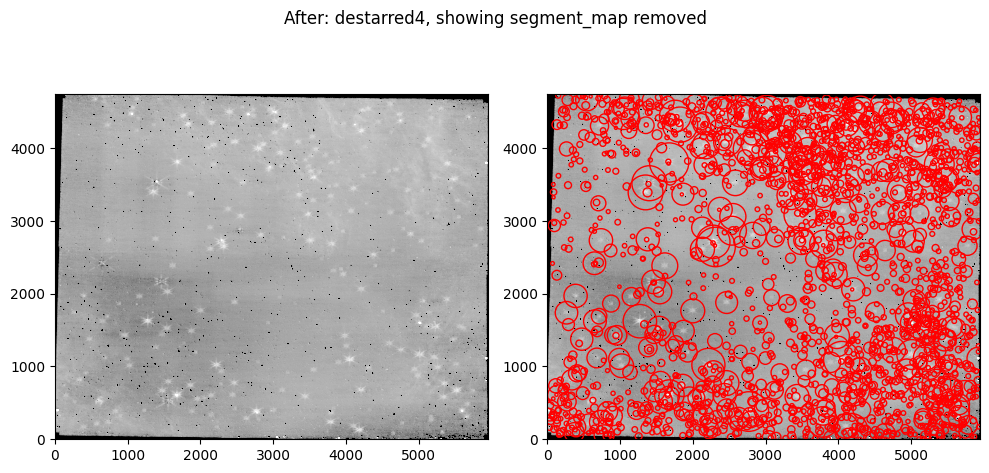

In [39]:
pl.figure(figsize=(10,5))
#pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=0.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,1).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.subplot(1,2,2).imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3.1, max_percent=99.95, stretch='log'), cmap='gray')
pl.scatter(cattbl['xcentroid'], cattbl['ycentroid'], marker='o', color='r', facecolor='none', s=cat.area)
pl.suptitle("After: destarred4, showing segment_map removed");
pl.tight_layout();

In [40]:
import regions
# TODOD regs = regions.Regions.read(f'{basepath}/regions_/manual_destar_right_187.reg')


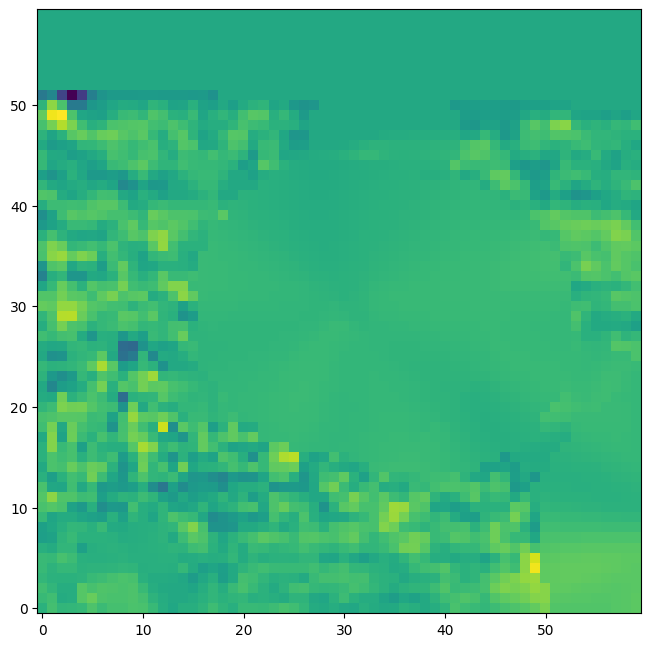

In [41]:
pl.imshow(co)

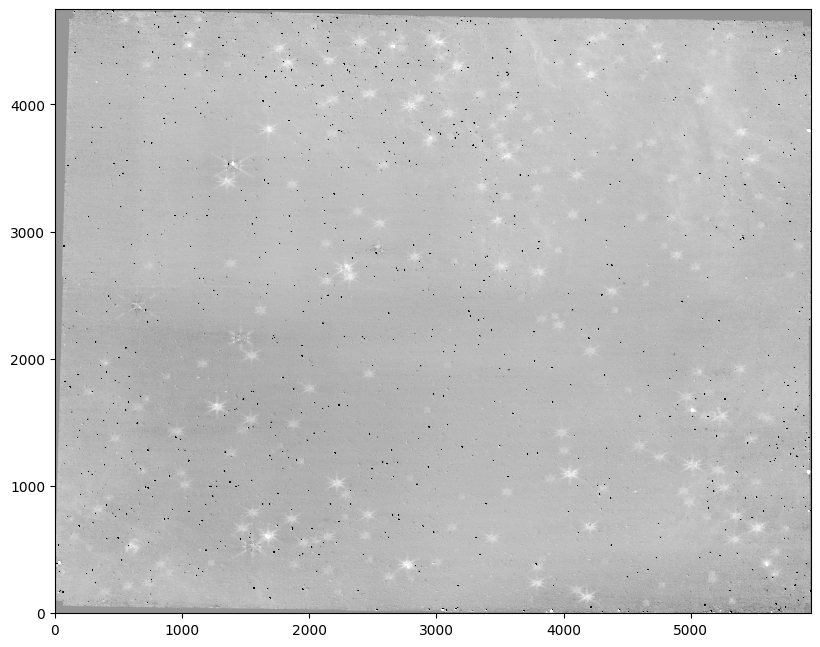

In [42]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=1, max_percent=99.95, stretch='log'), cmap='gray')
#pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r')

In [43]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred4.fits', overwrite=True)

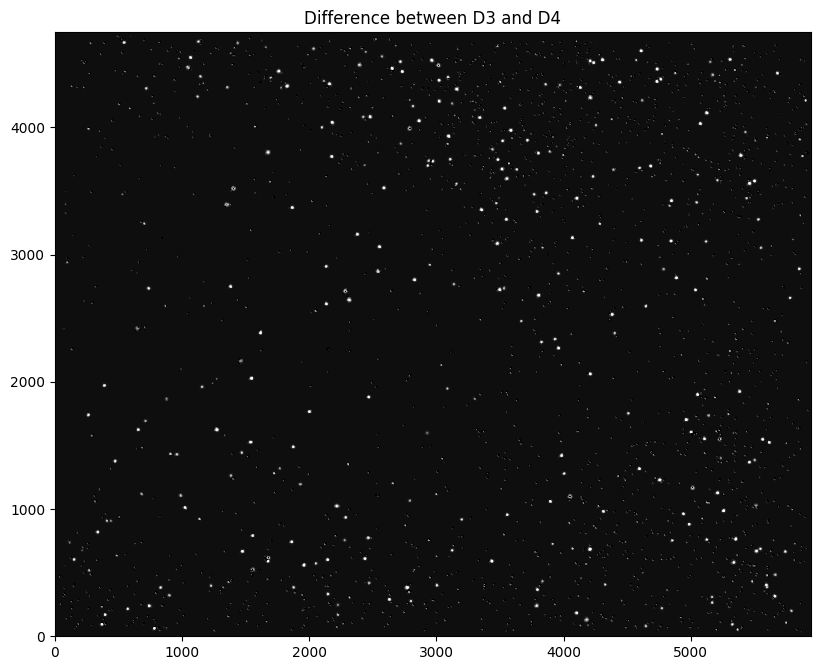

In [44]:
d3 = fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred3.fits')
d4 = fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred4.fits')
pl.imshow(np.nan_to_num(d3-d4), norm=simple_norm(d3-d4, min_percent=1, max_percent=99.95, stretch='log'), cmap='gray')
pl.title("Difference between D3 and D4");

In [45]:
data = fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred4.fits')

In [46]:
fh_182 = fits.open(f'{basepath}/F182M/pipeline/jw02221-o001_t001_nircam_clear-f182m-nrcb_i2d.fits')
stars_182_f = DAOStarFinder(threshold=25, fwhm=2.06, peakmax=150)(fh_182['SCI'].data)
len(stars_182_f)

48547

In [47]:
for row in tqdm(stars_182_f):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 3.5)

  0%|          | 0/48547 [00:00<?, ?it/s]

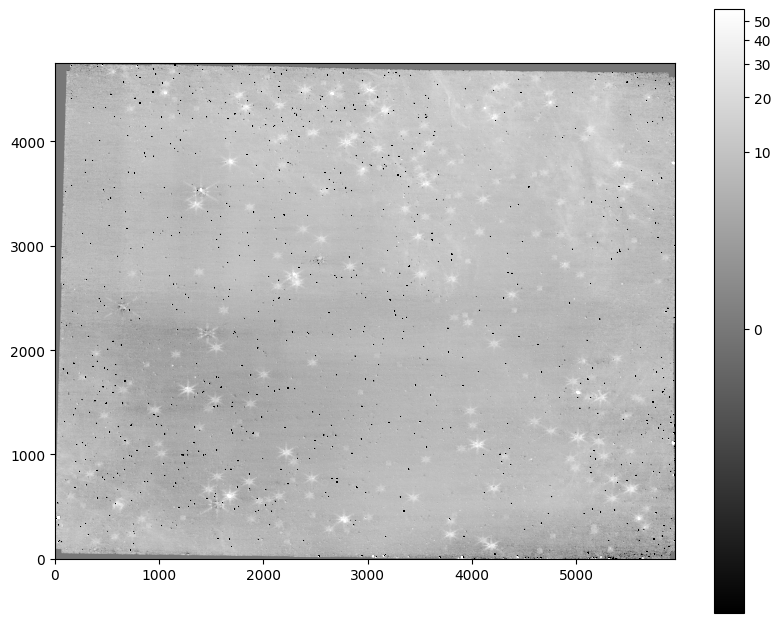

In [48]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=1, max_percent=99.95, stretch='log'), cmap='gray')
#pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r')
pl.colorbar();

In [49]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred5.fits', overwrite=True)

In [50]:
data = fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred5.fits')

In [51]:
# Saturated in f182
stars_paa_sat182 = DAOStarFinder(threshold=500, fwhm=2.06, peakmax=3000)(fh_187['SCI'].data)
len(stars_paa_sat182)

4165

In [52]:
for row in tqdm(stars_paa_sat182):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 15 and sy > 15 and sy < data.shape[0] - 15 and sx < data.shape[1] - 15:
        co = data[sy-15:sy+15, sx-15:sx+15]
        data[sy-15:sy+15, sx-15:sx+15] = kill_star(co, 5.5, 2)

  0%|          | 0/4165 [00:00<?, ?it/s]

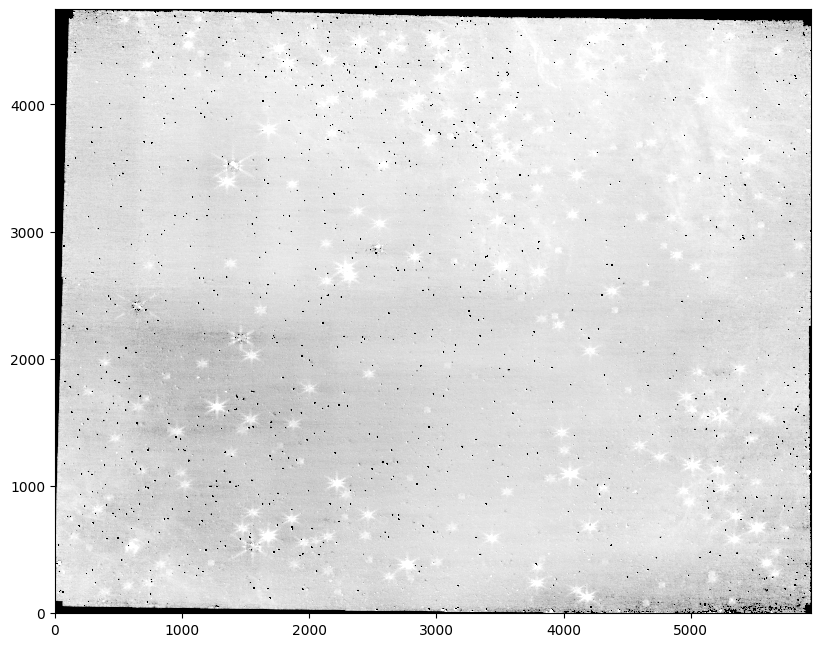

In [53]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=98., stretch='log'), cmap='gray')
#pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r')

In [54]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred6.fits', overwrite=True)

# Do it again for f212

## Destar 1

In [55]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb.fits')
np.isnan(data).sum()

300684

In [56]:
print(np.isnan(data).sum())
for sy, sx in tqdm(zip(*np.where(np.isnan(data)))):
    if sx > 5 and sy > 5 and sy < data.shape[0] - 5 and sx < data.shape[1] - 5:
        co = data[sy-5:sy+5, sx-5:sx+5]
        #print(np.isnan(co)).sum()
        data[sy-5:sy+5, sx-5:sx+5] = kill_star(co, 1)
        #print(np.isnan(data[sy-5:sy+5, sx-5:sx+5]).sum())
print(np.isnan(data).sum())
assert not np.isnan(data[1054,645]) #this check is for BrA...

300684


0it [00:00, ?it/s]

108513


In [57]:
data[data<0] = 0

In [58]:
stars_212 = DAOStarFinder(threshold=30, fwhm=2.341, peakmax=1e4)(data)
len(stars_212)

36798

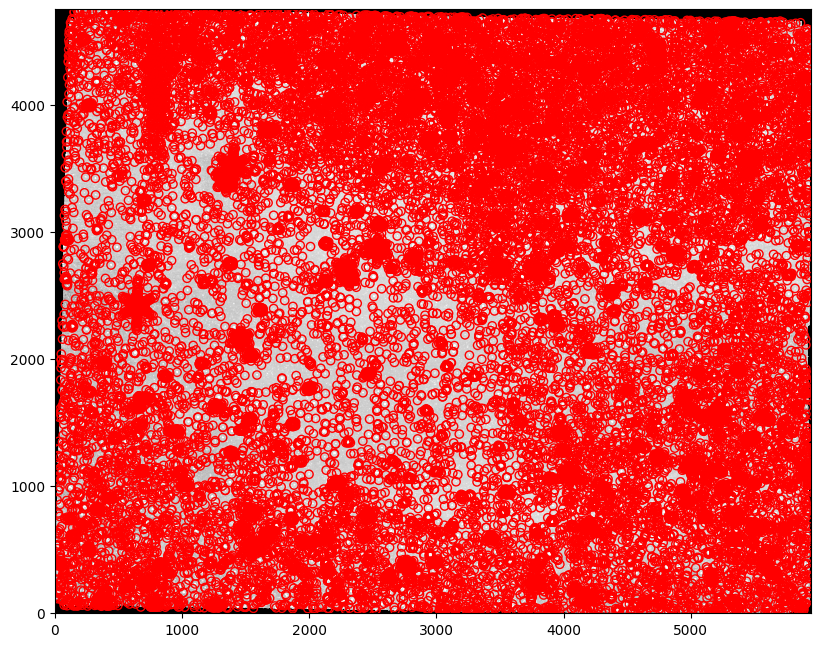

In [59]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=95., stretch='log'), cmap='gray')
pl.scatter(stars_212['xcentroid'], stars_212['ycentroid'], marker='o', color='r', edgecolor='r', facecolor='none')

In [60]:
for row in tqdm(stars_paa):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 3.5)

  0%|          | 0/26502 [00:00<?, ?it/s]

In [61]:
header = fits.getheader(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb.fits')
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred.fits', overwrite=True)

## Destar 2

In [78]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred2.fits')

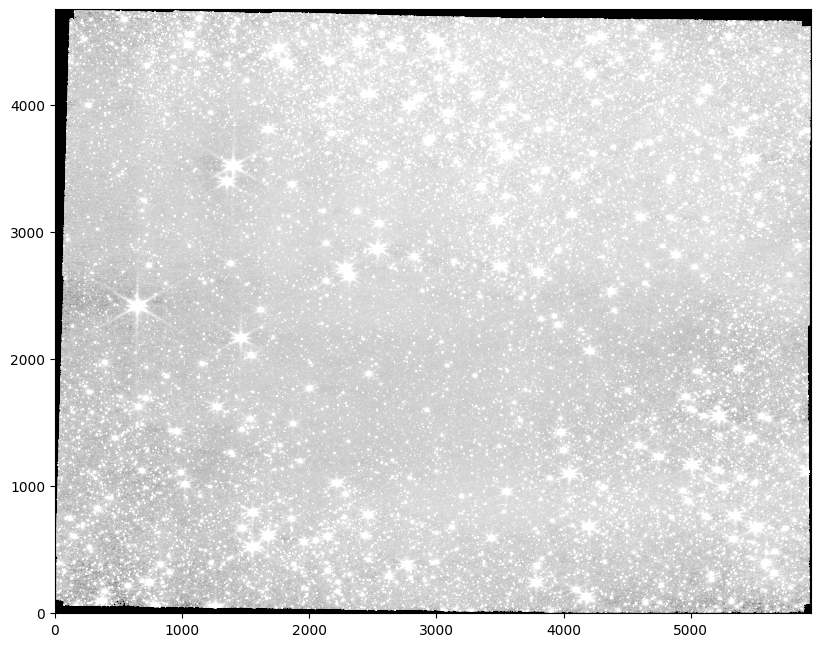

In [62]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=95., stretch='log'), cmap='gray')
#pl.scatter(stars_paa['xcentroid'], stars_paa['ycentroid'], marker='x', color='r')

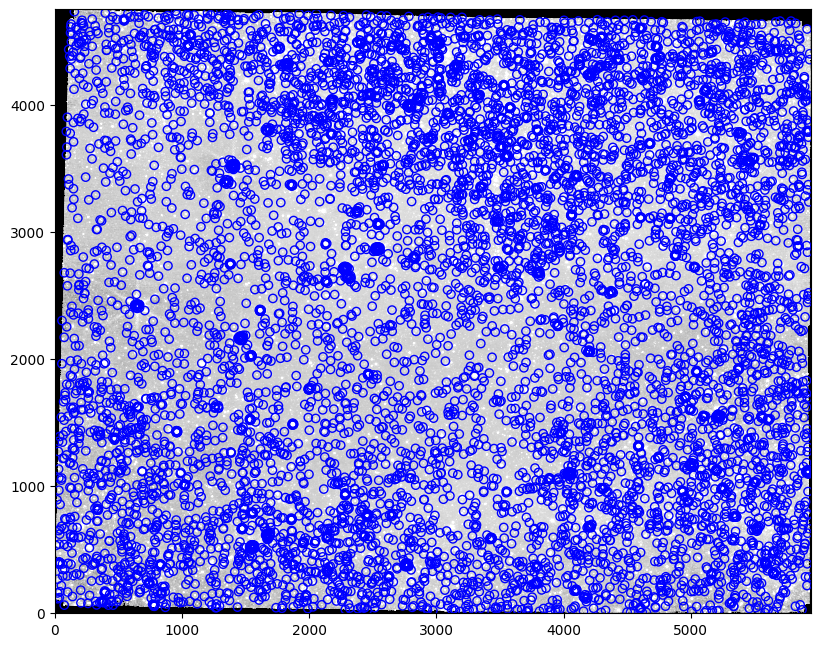

In [63]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=95., stretch='log'), cmap='gray')
pl.scatter(stars_182['xcentroid'], stars_182['ycentroid'], marker='o', color='b', edgecolor='b', facecolor='none')

In [64]:
for row in tqdm(stars_182):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 5.5, 1.5)

  0%|          | 0/8277 [00:00<?, ?it/s]

In [65]:
header = fits.getheader(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb.fits')
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred2.fits', overwrite=True)

In [66]:
fh_212 = fits.open(f'{basepath}/F212N/pipeline/jw02221-o001_t001_nircam_clear-f212n-nrcb_i2d.fits')
stars_212_br = DAOStarFinder(threshold=2000, fwhm=2.341, peakmax=3e4)(fh_212['SCI'].data)
len(stars_212_br)

2140

## Destar 3

In [67]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred2.fits')

/scratch/local/5800391/ipykernel_19124/2970563949.py:2: UserWarning: You passed a edgecolor/edgecolors ('g') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  pl.scatter(stars_212_br['xcentroid'], stars_212_br['ycentroid'], marker='x', color='g', edgecolor='g', facecolor='g')


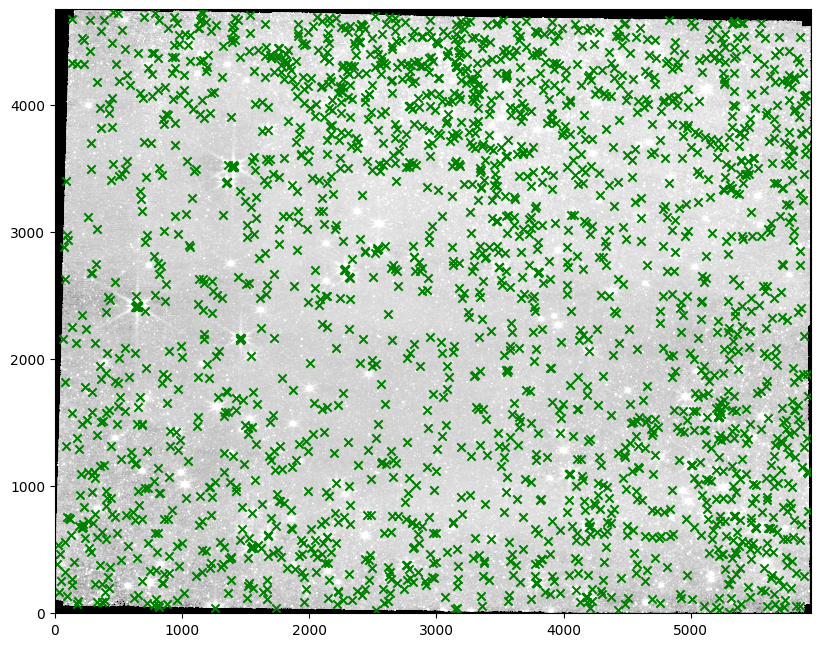

In [68]:
pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=95., stretch='log'), cmap='gray')
pl.scatter(stars_212_br['xcentroid'], stars_212_br['ycentroid'], marker='x', color='g', edgecolor='g', facecolor='g')

In [69]:
for row in tqdm(stars_212_br):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 30 and sy > 30 and sy < data.shape[0] - 30 and sx < data.shape[1] - 30:
        #co = data[sy-15:sy+15, sx-15:sx+15]
        #data[sy-15:sy+15, sx-15:sx+15] = kill_star(co, 7.5, 2)
        co = data[sy-30:sy+30, sx-30:sx+30]
        data[sy-30:sy+30, sx-30:sx+30] = kill_star(co, 15, 5)

  0%|          | 0/2140 [00:00<?, ?it/s]

In [70]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred3.fits', overwrite=True)

## Destar 4

In [328]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred3.fits')

In [329]:
from photutils.segmentation import detect_sources
segment_map = detect_sources(data, 50, npixels=5)

In [330]:
from photutils.segmentation import SourceCatalog
cat = SourceCatalog(data, segment_map)
cattbl = cat.to_table()

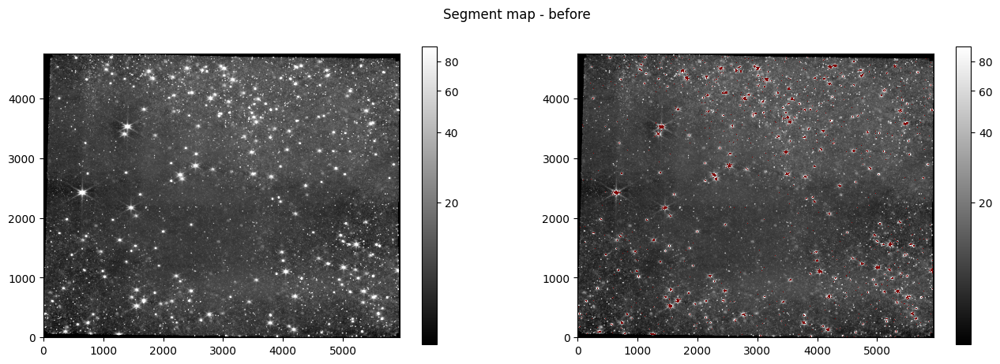

In [331]:
pl.figure(figsize=(16,5))
pl.suptitle("Segment map - before")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
ax2.imshow(np.where(segment_map.data > 0, 1, np.nan), cmap='jet_r', interpolation='none', );
pl.colorbar(mappable=im);
#pl.scatter(cat.xcentroid, cat.ycentroid, marker='x', color='r', edgecolor='r', facecolor='r', alpha=0.1);

comment
pixel coordinate of bright extended emission

xk,yk = 208,782

In [332]:
import scipy.ndimage
def kill_segment(cutout, mask, kernelwidth=1, dilate=0, nanneg=False):
    cutoutcopy = cutout.copy()
    if nanneg:
        mask[cutoutcopy < 0] = np.nan
    #print('msksum: ',msk.sum())
    if dilate > 0:
        mask = scipy.ndimage.binary_dilation(mask, iterations=dilate)
    cutoutcopy[mask] = np.nan
    sm = convolve(cutoutcopy, Gaussian2DKernel(kernelwidth))
    #sm[sm < 0] = 0
    cutoutcopy[mask] = sm[mask]
    return cutoutcopy

ind=2821, x=647, y=2417


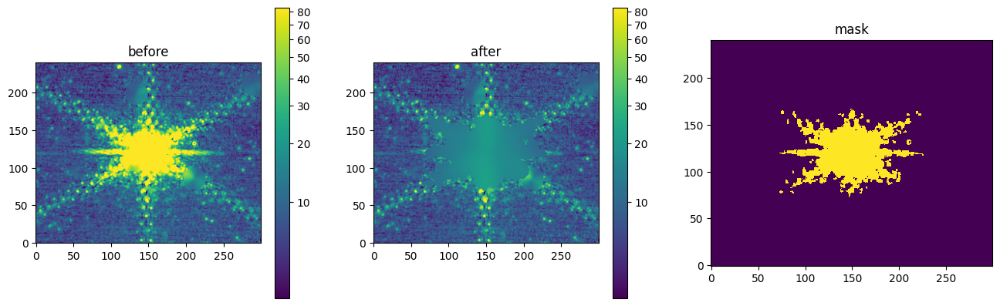

In [333]:
# one-row debug
x,y = 1407,3524
x,y = 647,2417
ind =  segment_map.data[y,x]
print(f"ind={ind}, x={x}, y={y}")

#for row in cat:
#    if row.area.value > 1000 and row.centroid[1] > 100 and row.centroid[0] > 100:
#        break
row = cat[ind-1]
dx = 30 if row.area.value < 225 else int(np.sqrt(row.area.value))
#rad_excise = 15 if row.area.value < 75 else 20
rad_kernel = 3 if row.area.value < 225 else np.sqrt(row.area.value) / 5

co = data[row.bbox.iymin-dx:row.bbox.iymax+dx,
          row.bbox.ixmin-dx:row.bbox.ixmax+dx]
mask = np.zeros(co.shape, dtype='bool')
mask[dx:-dx, dx:-dx] = row.segment > 0

ks = kill_segment(co, mask, kernelwidth=rad_kernel, dilate = 5)

norm = simple_norm(ks, min_percent=0.1, max_percent=99.9, stretch='asinh')

pl.figure(figsize=(16,5))
im = pl.subplot(1,3,1).imshow(co, norm=norm)
pl.colorbar(mappable=im)
pl.title("before")
im = pl.subplot(1,3,2).imshow(ks, norm=norm)
pl.colorbar(mappable=im)
pl.title("after")
pl.subplot(1,3,3).imshow(mask, interpolation='none');
pl.title("mask");

In [334]:
skipped = []
for ii,row in enumerate(tqdm(cat)):
    if row.area.value > 5500: 
        print(f"Skipping {ii}:{row}, {row.centroid} because area={row.area.value} > 5500")
        skipped.append(ii)
        continue
    if True: #xk < row.bbox.ixmin or xk > row.bbox.ixmax or yk < row.bbox.iymin or yk > row.bbox.ixmax:
        sx,sy = map(int, (row.centroid))
        dx = 30 if row.area.value < 225 else 2*int(np.sqrt(row.area.value))
        #rad_excise = 15 if row.area.value < 75 else 20
        rad_kernel = (3 if row.area.value < 225 else np.sqrt(row.area.value) / 5) * 2
        if row.bbox.ixmin > dx and row.bbox.iymin > dx and row.bbox.iymax < data.shape[0] - dx and row.bbox.ixmax < data.shape[1] - dx:
            co = data[row.bbox.iymin-dx:row.bbox.iymax+dx,
                      row.bbox.ixmin-dx:row.bbox.ixmax+dx]
            mask = np.zeros(co.shape, dtype='bool')
            mask[dx:-dx, dx:-dx] = row.segment > 0
            
            ks = kill_segment(co, mask, kernelwidth=rad_kernel, dilate = 3 if row.area.value < 81 else int(np.sqrt(row.area.value)/3))
            data[row.bbox.iymin-dx:row.bbox.iymax+dx,
                 row.bbox.ixmin-dx:row.bbox.ixmax+dx] = ks
            
            # debug
            # if True:
            #     norm = simple_norm(ks, min_percent=0.1, max_percent=99.9, stretch='asinh')
            #     pl.figure(figsize=(12,8))
            #     im = pl.subplot(2,2,1).imshow(co, norm=norm)
            #     pl.colorbar(mappable=im)
            #     pl.title("before (co)")
            #     im = pl.subplot(2,2,2).imshow(ks, norm=norm)
            #     pl.colorbar(mappable=im)
            #     pl.title("after (ks)")
            #     im = pl.subplot(2,2,3).imshow(data[row.bbox.iymin-dx:row.bbox.iymax+dx,
            #      row.bbox.ixmin-dx:row.bbox.ixmax+dx], norm=norm)
            #     pl.colorbar(mappable=im)
            #     pl.title("after: data")
            #     pl.subplot(2,2,4).imshow(mask, interpolation='none');
            #     pl.title("mask");
            #     break
                
        else:
            skipped.append(ii)
    else:
        print(f"Skipped {row} -> {row.centroid}")
        skipped.append(ii)
print(f"Skipped {len(skipped)} out of {len(cat)} rows")

  0%|          | 0/7094 [00:00<?, ?it/s]

Skipped 132 out of 7094 rows


In [335]:
x,y = 1407,3524
ind =  segment_map.data[y,x]
print(ind-1, cat[ind-1].bbox, data.shape)
assert ind-1 not in skipped

x,y = 647,2417
ind =  segment_map.data[y,x]
print(ind-1, cat[ind-1].bbox, data.shape)
assert ind-1 not in skipped

4112 BoundingBox(ixmin=1345, ixmax=1452, iymin=3480, iymax=3563) (4750, 5945)
2820 BoundingBox(ixmin=572, ixmax=726, iymin=2368, iymax=2463) (4750, 5945)


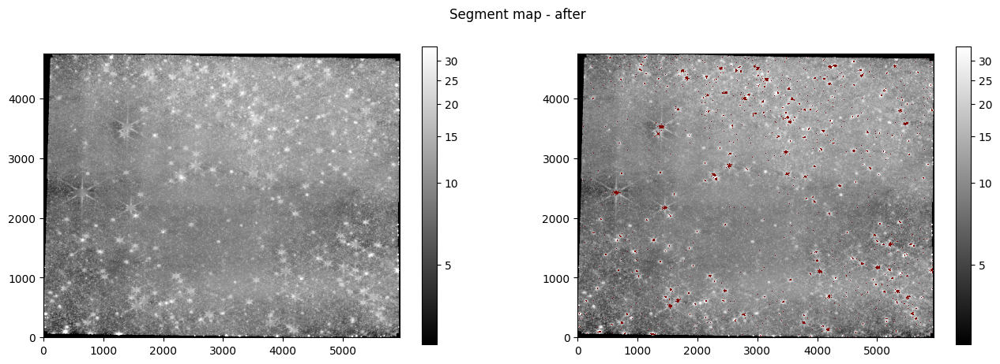

In [336]:
pl.figure(figsize=(16,5))
pl.suptitle("Segment map - after")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
ax2.imshow(np.where(segment_map.data > 0, 1, np.nan), cmap='jet_r', interpolation='none', );
pl.colorbar(mappable=im);
#pl.scatter(cat.xcentroid, cat.ycentroid, marker='x', color='r', edgecolor='r', facecolor='r', alpha=0.1);

ind=4113, x=1407, y=3524


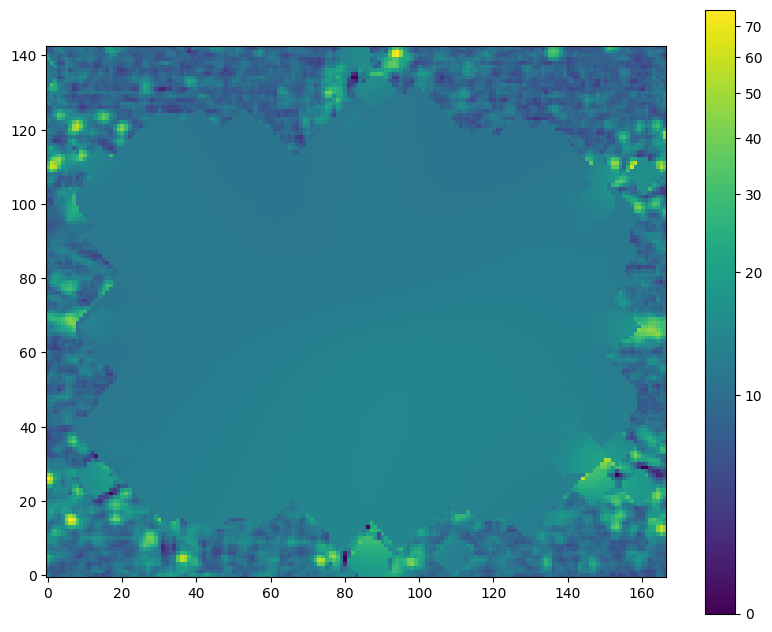

In [337]:
# one-row debug
x,y = 1407,3524
ind =  segment_map.data[y,x]
print(f"ind={ind}, x={x}, y={y}")

row = cat[ind-1]
co = data[row.bbox.iymin-dx:row.bbox.iymax+dx,
         row.bbox.ixmin-dx:row.bbox.ixmax+dx]

pl.imshow(
    co,
    norm=simple_norm(co, max_percent=99.99, stretch='asinh'),
);
pl.colorbar();

ind=2821, x=647, y=2417


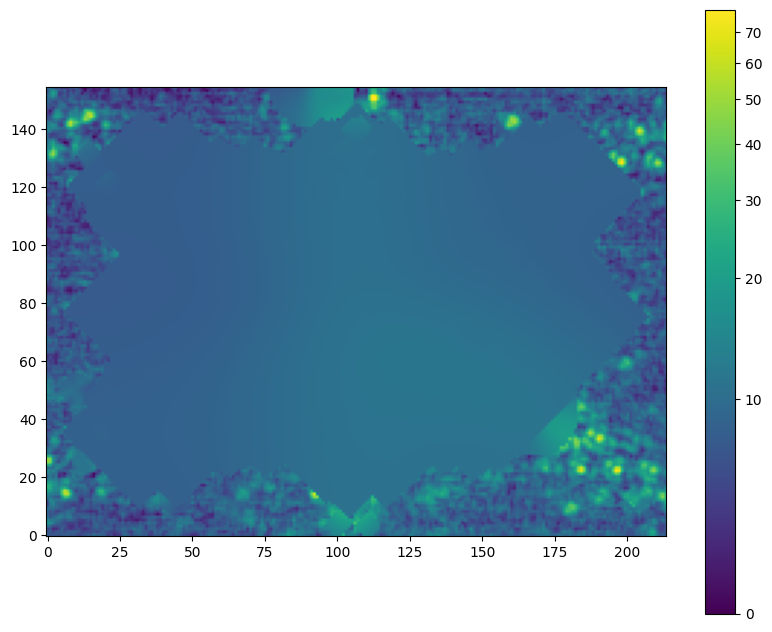

In [338]:
# one-row debug
x,y = 647,2417
ind =  segment_map.data[y,x]
print(f"ind={ind}, x={x}, y={y}")

row = cat[ind-1]
co = data[row.bbox.iymin-dx:row.bbox.iymax+dx,
         row.bbox.ixmin-dx:row.bbox.ixmax+dx]

pl.imshow(
    co,
    norm=simple_norm(co, max_percent=99.99, stretch='asinh'),
);
pl.colorbar();

In [339]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred4a.fits', overwrite=True)

## Destar 4b

In [362]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred4a.fits')

In [364]:
import regions
regs = regions.Regions.read(f'{basepath}/regions_/manual_destar_right_212.reg')

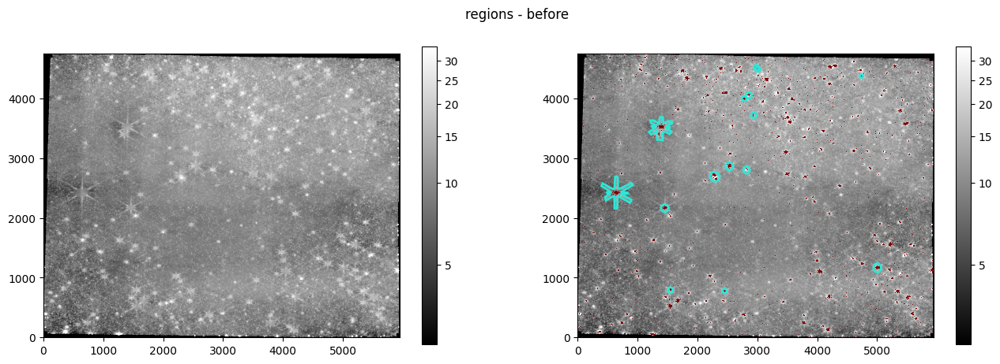

In [365]:
pl.figure(figsize=(16,5))
pl.suptitle("regions - before")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
ax2.imshow(np.where(segment_map.data > 0, 1, np.nan), cmap='jet_r', interpolation='none', );
for reg in regs:
    preg = reg.to_pixel(ww)
    preg.plot()
pl.colorbar(mappable=im);

In [368]:
for reg in tqdm(regs):
    preg = reg.to_pixel(ww)
    mask = preg.to_mask()
    bbox = mask.bbox
    dx = 20
    bbox.ixmin -= dx
    bbox.iymin -= dx
    bbox.ixmax += dx
    bbox.iymax += dx
    co = data[bbox.iymin:bbox.iymax, bbox.ixmin:bbox.ixmax].copy()
    co[dx:-dx, dx:-dx][mask.data.astype('bool')] = np.nan
    msk = np.isnan(co)
    smrad = np.max([10, np.sqrt(preg.area)/2])
    sm = convolve(co, Gaussian2DKernel(smrad))
    #sm[sm < 0] = 0
    co[msk] = sm[msk]
    data[bbox.iymin:bbox.iymax, bbox.ixmin:bbox.ixmax] = co

  0%|          | 0/16 [00:00<?, ?it/s]

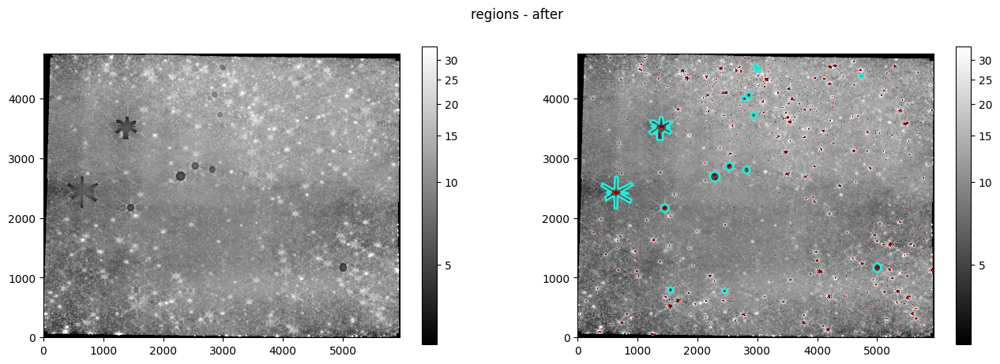

In [369]:
pl.figure(figsize=(16,5))
pl.suptitle("regions - after")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
ax2.imshow(np.where(segment_map.data > 0, 1, np.nan), cmap='jet_r', interpolation='none', );
for reg in regs:
    preg = reg.to_pixel(ww)
    preg.plot()
pl.colorbar(mappable=im);

In [370]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred4.fits', overwrite=True)

## Destar 5

In [371]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred4.fits')

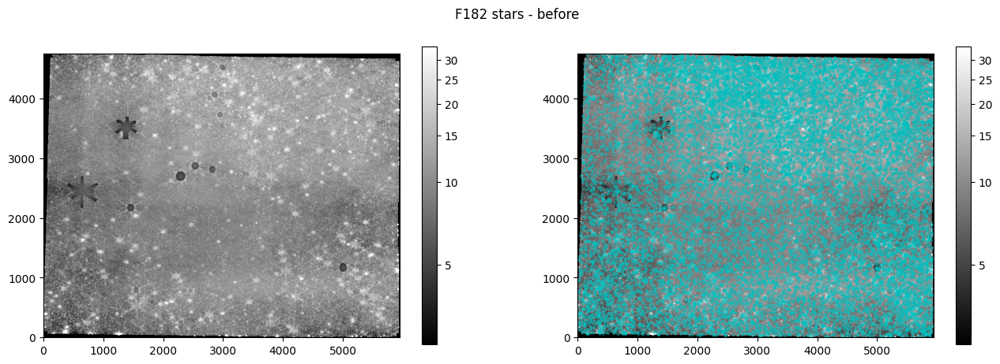

In [372]:
pl.figure(figsize=(16,5))
pl.suptitle("F182 stars - before")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
sel = stars_182_f['flux'] > 2
pl.scatter(stars_182_f['xcentroid'][sel], stars_182_f['ycentroid'][sel], marker='o', color='c', edgecolor='c', facecolor='none', alpha=0.5, s=3)
pl.colorbar(mappable=im);

In [373]:
sel = stars_182_f['flux'] > 2
for row in tqdm(stars_182_f[sel]):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 10 and sy > 10 and sy < data.shape[0] - 10 and sx < data.shape[1] - 10:
        co = data[sy-10:sy+10, sx-10:sx+10]
        data[sy-10:sy+10, sx-10:sx+10] = kill_star(co, 3.5)

  0%|          | 0/17277 [00:00<?, ?it/s]

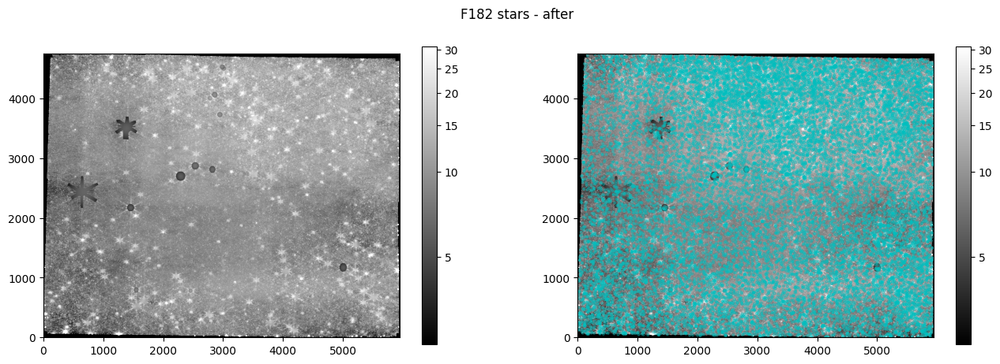

In [374]:
pl.figure(figsize=(16,5))
pl.suptitle("F182 stars - after")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.scatter(stars_182_f['xcentroid'][sel], stars_182_f['ycentroid'][sel], marker='o', color='c', edgecolor='c', facecolor='none', alpha=0.5, s=3)
pl.colorbar(mappable=im);

In [375]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred5.fits', overwrite=True)

## Destar 6

In [376]:
data = fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred5.fits')

In [377]:
# Saturated in f182
stars_212_sat182 = DAOStarFinder(threshold=500, fwhm=2.341, peakmax=3000)(fh_212['SCI'].data)
len(stars_212_sat182)

4902

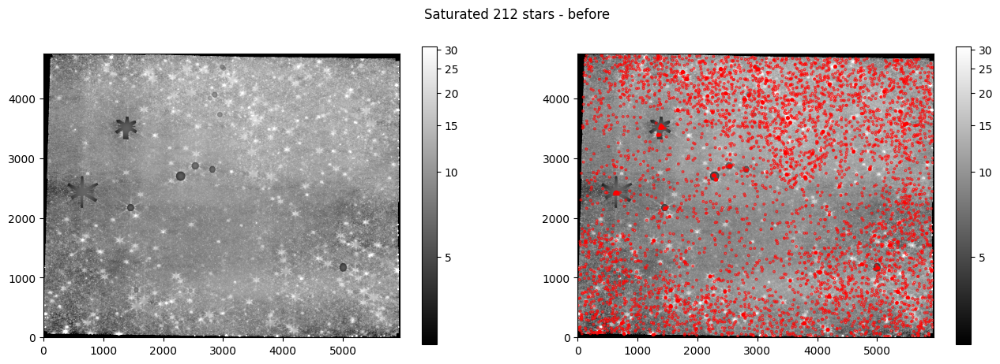

In [378]:
pl.figure(figsize=(16,5))
pl.suptitle("Saturated 212 stars - before")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.scatter(stars_212_sat182['xcentroid'], stars_212_sat182['ycentroid'], marker='o', color='r', edgecolor='r', facecolor='none', alpha=0.7, s=3)
pl.colorbar(mappable=im);

In [379]:
for row in tqdm(stars_212_sat182):
    sx,sy = map(int, (row['xcentroid'], row['ycentroid']))
    if sx > 15 and sy > 15 and sy < data.shape[0] - 15 and sx < data.shape[1] - 15:
        co = data[sy-15:sy+15, sx-15:sx+15]
        data[sy-15:sy+15, sx-15:sx+15] = kill_star(co, 5.5, 2)

  0%|          | 0/4902 [00:00<?, ?it/s]

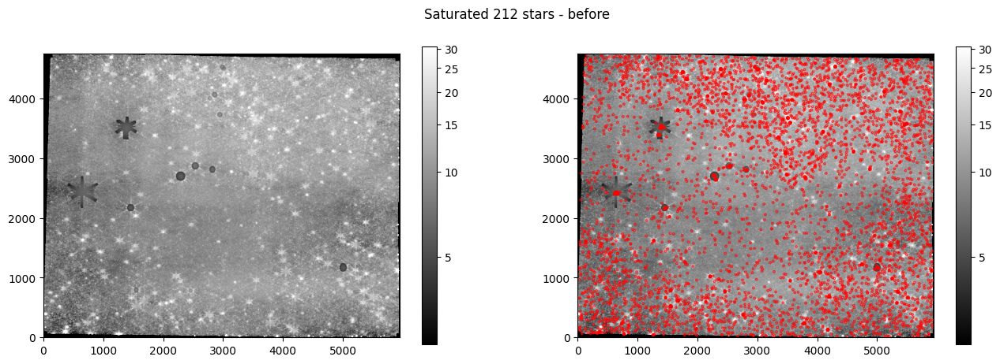

In [380]:
pl.figure(figsize=(16,5))
pl.suptitle("Saturated 212 stars - before")
pl.subplot(1,2,1)
im = pl.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.colorbar(mappable=im)
ax2 = pl.subplot(1,2,2)
im = ax2.imshow(np.nan_to_num(data), norm=simple_norm(data, min_percent=3, max_percent=99.5, stretch='asinh'), cmap='gray')
pl.scatter(stars_212_sat182['xcentroid'], stars_212_sat182['ycentroid'], marker='o', color='r', edgecolor='r', facecolor='none', alpha=0.7, s=3)
pl.colorbar(mappable=im);

In [381]:
fits.PrimaryHDU(data=data, header=header).writeto(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred6.fits', overwrite=True)

# Done with destar

In [382]:
import pyavm
import PIL
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb

In [383]:
(fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred6.fits').shape,
 fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred6.fits').shape,
 fits.getdata(f'{basepath}/images/F182_minus_F187_nrcb.fits').shape)

((4750, 5945), (4749, 5945), (4749, 5945))

In [384]:
rgb = np.array(
      [
       #fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb.fits'),
       #fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb.fits'),
       fits.getdata(f'{basepath}/images/F212_minus_F182cont_refitted212wcsto182_nrcb_destarred6.fits'),
       fits.getdata(f'{basepath}/images/F187_minus_F182cont_refitted187wcsto182_nrcb_destarred6.fits'),
       fits.getdata(f'{basepath}/images/F182_minus_F187_nrcb.fits')
      ]
).swapaxes(0,2).swapaxes(0,1)
#for layer in (0,1,2):
#    # desaturate stars (though this will whiten the edges!)
#    rgb[:,:,layer][np.isnan(rgb[:,:,layer])] = np.nanmax(rgb[:,:,layer])
#    rgb[:,:,layer][rgb[:,:,layer] == 0] = np.nanmax(rgb[:,:,layer])

/scratch/local/5800391/ipykernel_19124/2959651031.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  rgb = np.array(


AxisError: axis2: axis 2 is out of bounds for array of dimension 1

In [ ]:
AVM = pyavm.AVM.from_header(fits.getheader(f'{basepath}/images/F182_minus_F187_nrcb.fits'))
# AVM = pyavm.AVM.from_header(fits.getheader(f'{basepath}/F182M/pipeline/jw02221-o001_t001_nircam_clear-f182m-nrcb_i2d.fits', ext=['SCI', 1]))

In [ ]:
def save_rgb(img, filename):
    img = (img*256)
    img[img<0] = 0
    img[img>255] = 255
    img = img.astype('uint8')
    img = PIL.Image.fromarray(img[::-1,:,:])
    img.save(filename)

In [ ]:
narrowsum = rgb[:,:,0] + rgb[:,:,1]
rgb_scaled = np.array([
                       simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=90)(rgb[:,:,0]),
                       simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,1]),
                       simple_norm(narrowsum,  stretch='asinh', min_cut=-2, max_cut=210)(narrowsum)]).swapaxes(0,2).swapaxes(0,1)
hsv = rgb_to_hsv(rgb_scaled)
hsv[:,:,0] += -0.35  # 0.25 = 90/360
hsv[:,:,0] = hsv[:,:,0] % 1 
rgb_scaled = hsv_to_rgb(hsv)
pl.figure(figsize=(24,10))
pl.imshow(rgb_scaled, origin='lower')
pl.xticks([]);
pl.yticks([]);

outfn = f"{basepath}/images/BrickJWST_nrcb_longwave_narrowband_rotated.png"
save_rgb(rgb_scaled, outfn)
AVM.embed(outfn, outfn)

In [ ]:
narrowsum = rgb[:,:,0] + rgb[:,:,1]
rgb_scaled = np.array([
                       simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-2, max_cut=70)(rgb[:,:,0]),
                       simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=100)(rgb[:,:,1]),
                       simple_norm(narrowsum,  stretch='asinh', min_cut=-4, max_cut=170)(narrowsum)]).swapaxes(0,2).swapaxes(0,1)
hsv = rgb_to_hsv(rgb_scaled)
hsv[:,:,0] += -0.35  # 0.25 = 90/360
hsv[:,:,0] = hsv[:,:,0] % 1 
rgb_scaled = hsv_to_rgb(hsv)
pl.figure(figsize=(24,10))
pl.imshow(rgb_scaled, origin='lower')
pl.xticks([]);
pl.yticks([]);

outfn = f"{basepath}/images/BrickJWST_nrcb_longwave_narrowband_rotated_lighter.png"
save_rgb(rgb_scaled, outfn)
AVM.embed(outfn, outfn)

In [ ]:
PIL.Image.open(outfn)